# import

In [1]:
import pandas as pd
import numpy as np
import requests
import matplotlib.pyplot as plt

from PIL import Image
from io import BytesIO


# data

In [ ]:
# Login using e.g. `huggingface-cli login` to access this dataset
# df = pd.read_csv("hf://datasets/Codatta/MM-Food-100K/MM-Food-100K.csv")

In [2]:
# df.to_csv("df.csv", index=False)

df = pd.read_csv("./df.csv")


In [3]:
df.shape

(100000, 10)

In [6]:
df.head(3)

,image_url,camera_or_phone_prob,food_prob,dish_name,food_type,ingredients,portion_size,nutritional_profile,cooking_method,sub_dt
0,https://file.b18a.io/7843322356500104680_44354...,0.7,0.95,Fried Chicken,Restaurant food,"[""chicken"",""breading"",""oil""]","[""chicken:300g""]","{""fat_g"":25.0,""protein_g"":30.0,""calories_kcal""...",Frying,20250704
1,https://file.b18a.io/7833227147700100732_67487...,0.7,1.00,Pho,Restaurant food,"[""noodles"",""beef"",""basil"",""lime"",""green onions...","[""noodles:200g"",""beef:100g"",""vegetables:50g""]","{""fat_g"":15.0,""protein_g"":25.0,""calories_kcal""...",boiled,20250702
2,https://file.b18a.io/7832600581600103585_26423...,0.8,0.95,Pan-fried Dumplings,Restaurant food,"[""dumplings"",""chili oil"",""soy sauce""]","[""dumplings:300g"",""sauce:50g""]","{""fat_g"":15.0,""protein_g"":20.0,""calories_kcal""...",Pan-frying,20250625


## dish_name: strip + lower

In [5]:
df['dish_name'] = df['dish_name'].str.strip().str.lower()

In [20]:
df.duplicated().value_counts()

False    100000
Name: count, dtype: int64

In [26]:
df.isnull().sum().sort_values(ascending=False)

cooking_method          1358
dish_name                  2
camera_or_phone_prob       0
image_url                  0
food_type                  0
food_prob                  0
ingredients                0
portion_size               0
nutritional_profile        0
sub_dt                     0
dtype: int64

In [28]:
df.head(3)

,image_url,camera_or_phone_prob,food_prob,dish_name,food_type,ingredients,portion_size,nutritional_profile,cooking_method,sub_dt
0,https://file.b18a.io/7843322356500104680_44354...,0.7,0.95,fried chicken,Restaurant food,"[""chicken"",""breading"",""oil""]","[""chicken:300g""]","{""fat_g"":25.0,""protein_g"":30.0,""calories_kcal""...",Frying,20250704
1,https://file.b18a.io/7833227147700100732_67487...,0.7,1.00,pho,Restaurant food,"[""noodles"",""beef"",""basil"",""lime"",""green onions...","[""noodles:200g"",""beef:100g"",""vegetables:50g""]","{""fat_g"":15.0,""protein_g"":25.0,""calories_kcal""...",boiled,20250702
2,https://file.b18a.io/7832600581600103585_26423...,0.8,0.95,pan-fried dumplings,Restaurant food,"[""dumplings"",""chili oil"",""soy sauce""]","[""dumplings:300g"",""sauce:50g""]","{""fat_g"":15.0,""protein_g"":20.0,""calories_kcal""...",Pan-frying,20250625


In [30]:
dish_name_unique = df['dish_name'].unique()

In [ ]:
df_name_unique = pd.DataFrame(dish_name_unique, columns=['dish_name'])


array(['fried chicken', 'pho', 'pan-fried dumplings', ...,
       'mixed skewers and salad', 'tofu with dumplings', 'fruit powder'],
      shape=(18793,), dtype=object)

## baseline

In [20]:
foods = [
    "apple",
    "fried chicken",
    "pizza",
    "sushi",
    "sushi platter",
    "ramen",
    "mapo tofu",
    "egg tart",
    "boiled eggs",
    "grilled steak",
    "hamburger"
]

all_counts = df["dish_name"].value_counts()
result = all_counts.reindex(foods, fill_value=0)

print(result)

dish_name
apple            705
fried chicken    712
pizza            609
sushi            312
sushi platter    209
ramen            259
mapo tofu        256
egg tart         251
boiled eggs      206
grilled steak    194
hamburger        184
Name: count, dtype: int64


In [21]:
result_sum = result.sum()
result_sum

np.int64(3897)

In [24]:
baseline = round(712 / result_sum, 2)
baseline

np.float64(0.18)

## dishes_over_100

In [12]:
df['food_prob'].unique()

array([0.95, 1.  , 0.9 , 0.8 , 0.99])

In [7]:
# 统计每个 dish_name 出现次数
counts = df['dish_name'].value_counts()

# 看看前20个
print(counts.head(20))

dish_name
noodle soup                           1960
dumplings                             1236
hot pot                                995
stir-fried noodles                     817
fried chicken                          712
apple                                  705
watermelon                             695
fried rice                             612
pizza                                  609
beef noodle soup                       582
lychee                                 566
mixed asian cuisine                    530
grilled meat skewers                   520
seafood platter                        433
stir-fried chicken with vegetables     405
strawberries                           400
braised pork belly                     399
beef stir-fry                          389
braised pork                           384
vegetable stir-fry                     383
Name: count, dtype: int64


In [8]:
dishes_over_100 = counts[counts > 100]
print(dishes_over_100)

dish_name
noodle soup                1960
dumplings                  1236
hot pot                     995
stir-fried noodles          817
fried chicken               712
                           ... 
spicy fish stew             102
spicy hot pot               101
grilled shrimp              101
fried chicken with rice     101
fried snack                 101
Name: count, Length: 154, dtype: int64


In [27]:
# dish_name 计数超过100的名单
dish_list = dishes_over_100.index.tolist()

In [28]:
df_over_100 = df[df['dish_name'].isin(dish_list)]

In [29]:
df_over_100.head(3)

,image_url,camera_or_phone_prob,food_prob,dish_name,food_type,ingredients,portion_size,nutritional_profile,cooking_method,sub_dt
0,https://file.b18a.io/7843322356500104680_44354...,0.7,0.95,fried chicken,Restaurant food,"[""chicken"",""breading"",""oil""]","[""chicken:300g""]","{""fat_g"":25.0,""protein_g"":30.0,""calories_kcal""...",Frying,20250704
3,https://file.b18a.io/7839056601700101188_98515...,0.7,1.00,bananas,Raw vegetables and fruits,"[""Bananas""]","[""Bananas: 10 pieces (about 1kg)""]","{""fat_g"":3.0,""protein_g"":12.0,""calories_kcal"":...",Raw,20250718
4,https://file.b18a.io/7837642737500100261_17312...,0.8,0.90,noodle stir-fry,Restaurant food,"[""noodles"",""chicken"",""vegetables"",""sauce""]","[""noodles:300g"",""chicken:100g"",""vegetables:50g""]","{""fat_g"":20.0,""protein_g"":25.0,""calories_kcal""...",stir-fried,20250711


In [30]:
df_over_100.shape

(38280, 10)

In [35]:
dish_list

['noodle soup',
 'dumplings',
 'hot pot',
 'stir-fried noodles',
 'fried chicken',
 'apple',
 'watermelon',
 'fried rice',
 'pizza',
 'beef noodle soup',
 'lychee',
 'mixed asian cuisine',
 'grilled meat skewers',
 'seafood platter',
 'stir-fried chicken with vegetables',
 'strawberries',
 'braised pork belly',
 'beef stir-fry',
 'braised pork',
 'vegetable stir-fry',
 'durian',
 'stir-fried meat with vegetables',
 'noodle bowl',
 'steamed fish',
 'grapes',
 'stir-fried greens',
 'grilled skewers',
 'apples',
 'mixed chinese dishes',
 'instant noodles',
 'chicken stir-fry',
 'steamed buns',
 'sushi',
 'mixed asian dishes',
 'spicy crawfish',
 'bananas',
 'fried chicken wings',
 'birthday cake',
 'grilled meat platter',
 'braised meat',
 'shrimp stir-fry',
 'cooked white rice',
 'vegetable soup',
 'spicy noodle soup',
 'fruit salad',
 'spicy noodles',
 'crawfish',
 'ramen',
 'corn on the cob',
 'mapo tofu',
 'vegetable noodles',
 'egg tart',
 'roasted chicken',
 'cherries',
 'meat soup'

In [50]:
df[df['dish_name'] == 'shrimp']

,image_url,camera_or_phone_prob,food_prob,dish_name,food_type,ingredients,portion_size,nutritional_profile,cooking_method,sub_dt
140,https://file.b18a.io/7834224223400101631_85587...,0.7,0.95,shrimp,Homemade food,"[""shrimp"",""soy sauce"",""garlic""]","[""shrimp:300g""]","{""fat_g"":2.5,""protein_g"":40,""calories_kcal"":20...",boiled or steamed,20250722
425,https://file.b18a.io/7876656146200102870_65552...,0.7,0.90,shrimp,Homemade food,"[""shrimp""]","[""shrimp:300g""]","{""fat_g"":2.5,""protein_g"":40,""calories_kcal"":20...",boiled or steamed,20250708
1206,https://file.b18a.io/7836795962200104833_89269...,0.7,1.00,shrimp,Restaurant food,"[""shrimp""]","[""shrimp:300g""]","{""fat_g"":5.0,""protein_g"":20.0,""calories_kcal"":...",boiled or steamed,20250721
1484,https://file.b18a.io/7839061509600102038_99354...,0.7,1.00,shrimp,Homemade food,"[""shrimp"",""soy sauce"",""garlic""]","[""shrimp:300g""]","{""fat_g"":2.0,""protein_g"":40.0,""calories_kcal"":...",boiled or sautéed,20250705
1590,https://file.b18a.io/7839996399100100426_48605...,0.7,1.00,shrimp,Homemade food,"[""shrimp"",""soy sauce"",""garlic""]","[""shrimp:300g""]","{""fat_g"":2.0,""protein_g"":40.0,""calories_kcal"":...",boiled or steamed,20250629
...,...,...,...,...,...,...,...,...,...,...
98825,https://file.b18a.io/7837546252100104785_27138...,0.7,1.00,shrimp,Restaurant food,"[""shrimp""]","[""shrimp:300g""]","{""fat_g"":2.0,""protein_g"":40.0,""calories_kcal"":...",boiled or steamed,20250715
99070,https://file.b18a.io/7833613970700105883_97473...,0.8,1.00,shrimp,Raw vegetables and fruits,"[""shrimp""]","[""shrimp:300g""]","{""fat_g"":2.0,""protein_g"":40.0,""calories_kcal"":...",Raw,20250626
99167,https://file.b18a.io/7840122451300105377_15026...,0.7,0.90,shrimp,Restaurant food,"[""shrimp""]","[""shrimp:200g""]","{""fat_g"":2.0,""protein_g"":30.0,""calories_kcal"":...",Raw/Chilled,20250701
99200,https://file.b18a.io/7833004096800102286_77202...,0.7,0.90,shrimp,Raw vegetables and fruits,"[""shrimp""]","[""shrimp:300g""]","{""fat_g"":2.0,""protein_g"":40.0,""calories_kcal"":...",Raw,20250704


# dish_candidates

In [9]:
dish_candidates = [
    "sushi",
    "ramen",
    "sashimi",
    "sushi platter",
    "fried chicken",
    "apple",
    "pizza",
    "hamburger",
    "mapo tofu",
    "egg tart",
    "potato chips",
    "boiled eggs",
    "grilled steak",
    "oranges",
    "shrimp"
]

In [18]:
df_candidates = df[df['dish_name'].isin(dish_candidates)].copy()

In [11]:
df_candidates.shape

(4449, 10)

In [12]:
df_candidates.head(3)

,image_url,camera_or_phone_prob,food_prob,dish_name,food_type,ingredients,portion_size,nutritional_profile,cooking_method,sub_dt
0,https://file.b18a.io/7843322356500104680_44354...,0.7,0.95,fried chicken,Restaurant food,"[""chicken"",""breading"",""oil""]","[""chicken:300g""]","{""fat_g"":25.0,""protein_g"":30.0,""calories_kcal""...",Frying,20250704
9,https://file.b18a.io/7837744076300109224_10189...,0.7,0.90,oranges,Raw vegetables and fruits,"[""oranges""]","[""oranges: 100g""]","{""fat_g"":0.2,""protein_g"":1.2,""calories_kcal"":6...",Raw,20250704
34,https://file.b18a.io/7840773636700102334_18952...,0.7,1.00,apple,Raw vegetables and fruits,"[""apple""]","[""apple:200g""]","{""fat_g"":0.3,""protein_g"":0.5,""calories_kcal"":9...",Raw,20250714


In [17]:
df_candidates[df_candidates['dish_name'] == 'egg tart']

,image_url,camera_or_phone_prob,food_prob,dish_name,food_type,ingredients,portion_size,nutritional_profile,cooking_method,sub_dt
654,https://file.b18a.io/7832954547900101785_81042...,0.7,0.9,egg tart,Restaurant food,"[""egg"",""milk"",""sugar"",""flour"",""butter""]","[""pastry:100g""]","{""fat_g"":10.0,""protein_g"":4.0,""calories_kcal"":...",Baked,20250715
741,https://file.b18a.io/7833074159700107678_58682...,0.7,0.9,egg tart,Restaurant food,"[""flour"",""egg"",""sugar"",""butter""]","[""pastry:100g""]","{""fat_g"":15.0,""protein_g"":5.0,""calories_kcal"":...",Baking,20250721
1083,https://file.b18a.io/7833150719400100629_32769...,0.8,1.0,egg tart,Restaurant food,"[""pastry"",""egg"",""sugar"",""milk""]","[""pastry:100g"",""filling:50g""]","{""fat_g"":15.0,""protein_g"":6.0,""calories_kcal"":...",Baking,20250719
2209,https://file.b18a.io/7833382865600100525_46227...,0.7,0.9,egg tart,Packaged food,"[""flour"",""egg"",""sugar"",""milk""]","[""pastry:100g""]","{""fat_g"":10.0,""protein_g"":4.0,""calories_kcal"":...",Baked,20250722
3031,https://file.b18a.io/7848243821000106911_45448...,0.7,0.9,egg tart,Homemade food,"[""pastry"",""egg"",""sugar"",""milk""]","[""pastry:100g""]","{""fat_g"":10.0,""protein_g"":4.0,""calories_kcal"":...",Baking,20250703
...,...,...,...,...,...,...,...,...,...,...
98430,https://file.b18a.io/7839462958200107761_78181...,0.8,1.0,egg tart,Homemade food,"[""flour"",""egg"",""milk"",""sugar""]","[""egg tart:150g""]","{""fat_g"":15.0,""protein_g"":6.0,""calories_kcal"":...",Baking,20250704
98945,https://file.b18a.io/7837769799800105380_21260...,0.7,0.9,egg tart,Restaurant food,"[""pastry"",""egg"",""milk"",""sugar""]","[""pastry:100g"",""filling:50g""]","{""fat_g"":15.0,""protein_g"":5.0,""calories_kcal"":...",Baking,20250718
99146,https://file.b18a.io/7841465951300100634_40698...,0.7,1.0,egg tart,Restaurant food,"[""pastry"",""egg"",""milk"",""sugar""]","[""egg tart:100g""]","{""fat_g"":10.0,""protein_g"":4.0,""calories_kcal"":...",Baked,20250704
99688,https://file.b18a.io/7865199488500108880_52067...,0.7,0.9,egg tart,Homemade food,"[""pastry"",""egg"",""milk"",""sugar""]","[""pastry:100g""]","{""fat_g"":10.0,""protein_g"":4.0,""calories_kcal"":...",Baking,20250709


In [19]:
df_candidates['dish_name'].value_counts()

dish_name
fried chicken    712
apple            705
pizza            609
sushi            312
ramen            259
mapo tofu        256
egg tart         251
sushi platter    209
boiled eggs      206
grilled steak    194
hamburger        184
oranges          176
shrimp           139
potato chips     129
sashimi          108
Name: count, dtype: int64

In [20]:
df_limited = (
    df_candidates
    .groupby("dish_name", group_keys=False)
    .apply(lambda x: x.sample(n=500, random_state=42) if len(x) > 500 else x)
    .reset_index(drop=True)
)

/tmp/ipykernel_101363/2384499122.py:4: FutureWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  .apply(lambda x: x.sample(n=500, random_state=42) if len(x) > 500 else x)


In [23]:
df_limited.shape

(3923, 10)

In [21]:
df_limited["dish_name"].value_counts()


dish_name
apple            500
fried chicken    500
pizza            500
sushi            312
ramen            259
mapo tofu        256
egg tart         251
sushi platter    209
boiled eggs      206
grilled steak    194
hamburger        184
oranges          176
shrimp           139
potato chips     129
sashimi          108
Name: count, dtype: int64

In [22]:
df_limited.to_csv("df_limited.csv", index=False)


## 检查图片是否损坏（很慢 约1s1张）

In [39]:
def is_image_valid(url, timeout=5):
    try:
        response = requests.get(url, timeout=timeout)
        if response.status_code != 200:
            return False

        img = Image.open(BytesIO(response.content))
        img.verify()  # 检查是否损坏
        return True
    except:
        return False

In [ ]:
# 应用函数到 dataframe
df_candidates["is_valid"] = df_candidates["image_url"].apply(is_image_valid)


In [ ]:
# 删除损坏图片
df_clean = df_candidates[df_candidates["is_valid"]].copy()
df_clean = df_clean.drop(columns=["is_valid"])

## 检查图片内容

In [4]:
def show_images_for_dish(df, dish_name, n=50):
    subset = df[df["dish_name"] == dish_name].sample(n)
    fig, axes = plt.subplots(5, 10, figsize=(20, 10))
    axes = axes.flatten()

    for ax, (_, row) in zip(axes, subset.iterrows()):
        try:
            response = requests.get(row["image_url"], timeout=10)
            img = Image.open(BytesIO(response.content))
            ax.imshow(img)
        except:
            pass
        ax.axis("off")

    plt.suptitle(dish_name)
    plt.tight_layout()
    plt.show()


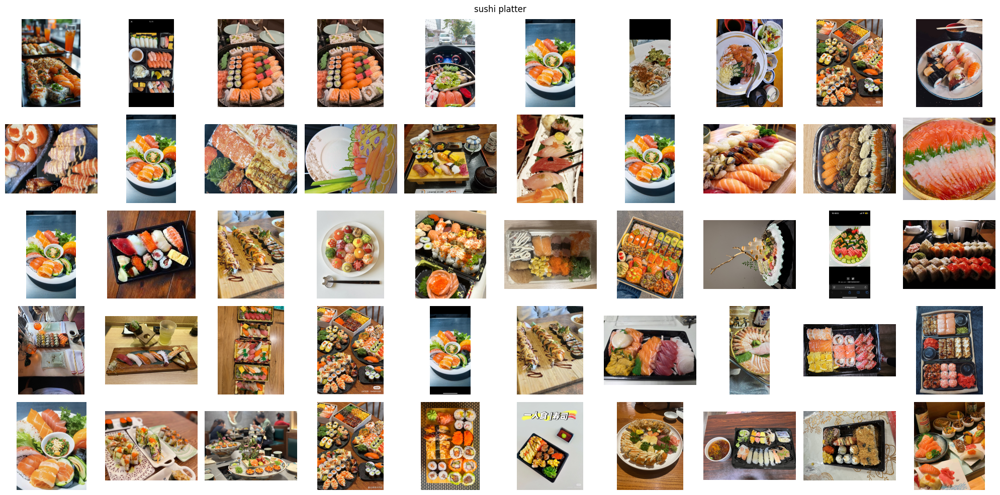

In [7]:
show_images_for_dish(df, "sushi platter", 50)

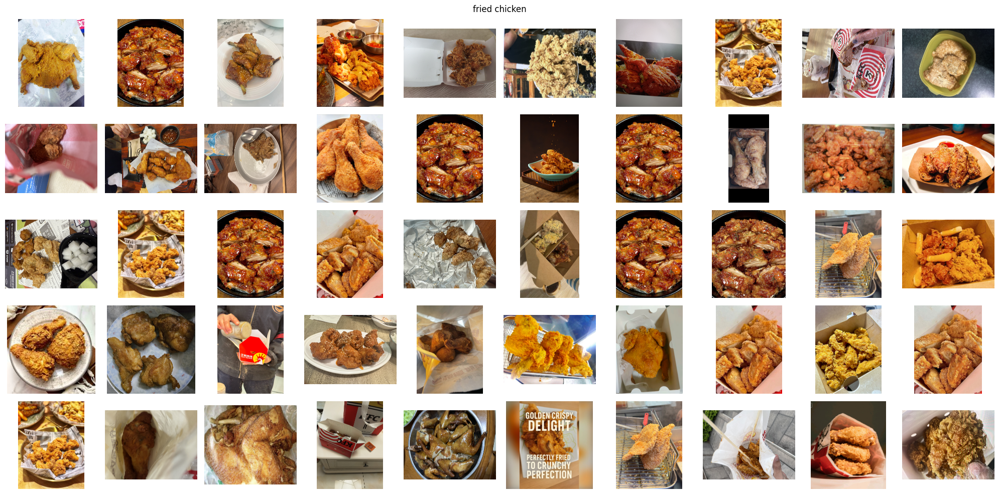

In [8]:
show_images_for_dish(df, "fried chicken", 50)

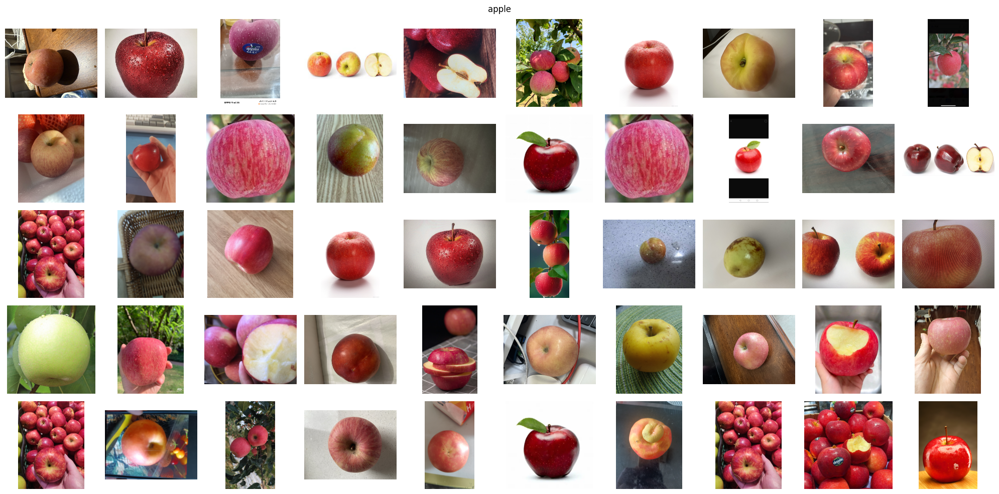

In [9]:
show_images_for_dish(df, "apple", 50)

In [ ]:
# 保存 cleaned 版本
df_clean.to_csv("cleaned_dataset.csv", index=False)